In [1]:
%load_ext autoreload
%autoreload 2

## Basic setup

In [2]:
import concord as ccd
import scanpy as sc
import torch
import warnings
from pathlib import Path
warnings.filterwarnings('ignore')
import time
from pathlib import Path
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
seed = 0

/home/ec2-user/miniforge3/envs/concord/lib/python3.12/site-packages/louvain/__init__.py:54: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import get_distribution, DistributionNotFound


In [3]:
import time
from pathlib import Path
proj_name = "pancreasv1_hyper"
file_name = proj_name
file_suffix = time.strftime('%b%d-%H%M')
seed = 0

save_dir = Path(f"../save/{proj_name}")
save_dir.mkdir(parents=True, exist_ok=True)

data_dir = Path(f"../data/{proj_name}")
data_dir.mkdir(parents=True, exist_ok=True)


In [5]:
adata = sc.read(
    data_dir / "dataset.h5ad"
)
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

adata.write_h5ad(data_dir / f"{file_name}_preprocessed.h5ad")
print(f"✅ Preprocessed data saved to {data_dir / f'{file_name}_preprocessed.h5ad'}")

✅ Preprocessed data saved to ../data/pancreasv1_hyper/pancreasv1_hyper_preprocessed.h5ad


In [8]:
import json, math, subprocess, scanpy as sc
from pathlib import Path

# ------------------------------------------------------------
# 1. global sweep settings
# ------------------------------------------------------------
TOTAL_STEPS   = 3000          # keep *updates* per run constant
BASE_LR       = 1e-2            # lr used at BASE_BATCH
BASE_BATCH    = 256              # reference batch for LR scaling


N_CELLS = adata.n_obs
print(f"✔ Dataset has {N_CELLS:,} cells")
vegs = {
    1000 : ccd.ul.select_features(adata, n_top_features=1000,
                                  flavor="seurat_v3"),
    3000 : ccd.ul.select_features(adata, n_top_features=3000,
                                  flavor="seurat_v3"),
    4000 : ccd.ul.select_features(adata, n_top_features=4000,
                                  flavor="seurat_v3"),
    5000 : ccd.ul.select_features(adata, n_top_features=5000,
                                  flavor="seurat_v3"),
    6000 : ccd.ul.select_features(adata, n_top_features=6000,
                                  flavor="seurat_v3"),
    8000 : ccd.ul.select_features(adata, n_top_features=8000,
                                  flavor="seurat_v3"),
    10000: ccd.ul.select_features(adata, n_top_features=10000,
                                  flavor="seurat_v3"),
}

✔ Dataset has 16,382 cells
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...


In [9]:
# HCL mode jobs
# ------------------------------------------------------------
DATA_FILE     = f"{file_name}_preprocessed.h5ad"
# ------------------------------------------------------------

feature_list = ccd.ul.select_features(adata, n_top_features=5000, flavor='seurat_v3')
hcl_base_args = {
    "latent_dim": 50,
    "batch_size": BASE_BATCH,
    "input_feature": feature_list,
    "encoder_dims": [500],
    "p_intra_domain": 1.0,
    "p_intra_knn": 0.0,
    "clr_beta": 1.0,
    "augmentation_mask_prob": 0.30,
    "clr_temperature": 0.40,
    "sampler_knn": 1000,
    "dropout_prob": 0.0,
    "n_epochs": 15,        # gets overwritten below
    "lr":       BASE_LR,   # gets overwritten below
    "save_dir": "../" + str(save_dir),
}


param_grid = {
    "batch_size":  [16, 32, 64, 128, 256, 512, 1024, 2048],     # sweep 2 values
    "latent_dim":  [10, 50, 100, 500, 1000],    # sweep 2 values
    "p_intra_domain": [0.6, 0.7, 0.8, 0.9, 0.95, 1.0],  # sweep 6 values
    "clr_beta" : [0.0, 0.5, 1.0, 2.0, 6.0],  # sweep 5 values
    "augmentation_mask_prob": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],  # sweep 5 values
    "clr_temperature": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],  # sweep 
    "n_epochs": [1, 2, 3, 4, 5, 10, 15, 20, 30],  # sweep 9 values
    "encoder_dims": [[50], [100], [500], [1000], [2000], [5000]],  # fixed
    "input_feature": list(vegs.values())
}

# ------------------------------------------------------------
# 3. expand jobs (one-at-a-time)
# ------------------------------------------------------------
hcl_jobs = ccd.bm.expand_one_at_a_time(
    hcl_base_args,
    param_grid,
    base_tag="concord_hcl",
)

# ------------------------------------------------------------
# 4. adjust epochs + lr for each job
# ------------------------------------------------------------
output_dir = "../jobs"
verbose    = False          # add --verbose when needed

for kw in hcl_jobs:
    B = kw["batch_size"]

    # a) compute epochs so updates == TOTAL_STEPS
    steps_per_epoch = math.ceil(N_CELLS / B)
    kw["n_epochs"]  = math.ceil(TOTAL_STEPS / steps_per_epoch)
    print(f"✔ {kw['batch_size']:,} batch size: {kw['n_epochs']} epochs, {steps_per_epoch} steps per epoch")

    # kw["lr"] = BASE_LR #* B / BASE_BATCH
    kw["lr"] = BASE_LR 

    # --------------------------------------------------------
    # 5. hand off to script generator
    # --------------------------------------------------------
    cmd = [
        "python", "./generate_py_jobs.py",
        "--proj_name",      proj_name,
        "--adata_filename", DATA_FILE,
        "--methods",        "concord_hcl",
        "--batch_key",      "batch",
        "--state_key",      "None",
        "--latent_dim",     str(kw["latent_dim"]),
        "--output_dir",     output_dir,
        "--device",         "auto",
        "--conda_env",      "cellpath",
        "--runtime",        "02:00:00",
        "--concord_kwargs", json.dumps(kw),
    ]
    if verbose:
        cmd.append("--verbose")

    subprocess.run(cmd, check=True)

print(f"✔ Generated {len(hcl_jobs)} jobs for concord_hcl mode in {output_dir}")

concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
✔ 16 batch size: 3 epochs, 1024 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_hcl_concord_hcl_batch_size-16.py
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_hcl_concord_hcl_batch_size-16.sh

✔ 32 batch size: 6 epochs, 512 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_hcl_concord_hcl_batch_size-32.py
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_hcl_concord_hcl_batch_size-32.sh

✔ 64 batch size: 12 epochs, 256 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_hcl_concord_hcl_batch_size-64.py
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_hcl_concord_hcl_batch_size-64.sh

✔ 128 batch size: 24 epochs, 128 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancrea

In [ ]:
# KNN mode jobs
# ------------------------------------------------------------
# 2. base & grid
# ------------------------------------------------------------
knn_base_args = {
    "latent_dim": 50,
    "batch_size": BASE_BATCH,
    "input_feature": feature_list,
    "encoder_dims": [500],
    "p_intra_domain": 1.0,
    "p_intra_knn": 0.3,
    "clr_beta": 0.0,
    "augmentation_mask_prob": 0.30,
    "clr_temperature": 0.30,
    "sampler_knn": 1000,
    "dropout_prob": 0.0,
    "n_epochs": 15,        # gets overwritten below
    "lr":       BASE_LR,   # gets overwritten below
    "save_dir": "../" + str(save_dir),
}


param_grid = {
    "batch_size":  [16, 32, 64, 128, 256, 512, 1024, 2048],     # sweep 2 values
    "latent_dim":  [10, 50, 100, 500, 1000],    # sweep 2 values
    "p_intra_domain": [0.6, 0.7, 0.8, 0.9, 0.95, 1.0],  # sweep 6 values
    "p_intra_knn" : [0.0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1.0],  
    "sampler_knn": [100, 300, 1000, 3000, 10000],  # sweep 5 values
    "augmentation_mask_prob": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8], 
    "clr_temperature": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8],  # sweep 
    "encoder_dims": [[50], [100], [500], [1000], [2000], [5000]],  # fixed
    "n_epochs": [1,2,3,4,5, 10, 15, 20, 30],
    "input_feature": list(vegs.values())
}

# ------------------------------------------------------------
# 3. expand jobs (one-at-a-time)
# ------------------------------------------------------------
knn_jobs = ccd.bm.expand_one_at_a_time(
    knn_base_args,
    param_grid,
    base_tag="concord_knn",
)

# ------------------------------------------------------------
# 4. adjust epochs + lr for each job
# ------------------------------------------------------------
output_dir = "../jobs"
verbose    = False          # add --verbose when needed

for kw in knn_jobs:
    B = kw["batch_size"]

    # a) compute epochs so updates == TOTAL_STEPS
    steps_per_epoch = math.ceil(N_CELLS / B)
    kw["n_epochs"]  = math.ceil(TOTAL_STEPS / steps_per_epoch)
    print(f"✔ {kw['batch_size']:,} batch size: {kw['n_epochs']} epochs, {steps_per_epoch} steps per epoch")

    # b) scale learning-rate linearly with batch size
    # kw["lr"] = BASE_LR #* B / BASE_BATCH
    kw["lr"] = BASE_LR 

    # --------------------------------------------------------
    # 5. hand off to script generator
    # --------------------------------------------------------
    cmd = [
        "python", "./generate_py_jobs.py",
        "--proj_name",      proj_name,
        "--adata_filename", DATA_FILE,
        "--methods",        "concord_knn",
        "--batch_key",      "batch",
        "--state_key",      "None",
        "--latent_dim",     str(kw["latent_dim"]),
        "--output_dir",     output_dir,
        "--device",         "auto",
        "--conda_env",      "concord",
        "--runtime",        "02:00:00",
        "--concord_kwargs", json.dumps(kw),
    ]
    if verbose:
        cmd.append("--verbose")

    subprocess.run(cmd, check=True)

print(f"✔ Generated {len(knn_jobs)} jobs for concord_knn mode in {output_dir}")

✔ 16 batch size: 3 epochs, 1024 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-16.py
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-16.sh

✔ 32 batch size: 6 epochs, 512 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-32.py
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-32.sh

✔ 64 batch size: 12 epochs, 256 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-64.py
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-64.sh

✔ 128 batch size: 24 epochs, 128 steps per epoch
✅ Generated: benchmark_pancreasv1_hyper/benchmark_pancreasv1_hyper_concord_knn_concord_knn_batch_size-128.py
✅ Generated: benchmark_pancreasv1_hyper/benchmar

In [11]:
proj_folder = Path(output_dir) / f"benchmark_{proj_name}"   # ../jobs/benchmark_<proj>
proj_folder.mkdir(exist_ok=True)                      # defensive

submit_all = proj_folder / f"submit_all_{proj_name}.sh"
with submit_all.open("w") as f:
    f.write("#!/bin/bash\n")
    f.write("# Auto-generated — submits every job for this project\n")
    f.write("# Run from this folder, or let the script cd into it.\n\n")
    f.write('cd "$(dirname "$0")"\n\n')          # ensures we’re in the right dir
    for sh_file in sorted(proj_folder.glob(f"benchmark_{proj_name}_*.sh")):
        f.write(f'qsub "{sh_file.name}"\n')

submit_all.chmod(0o755)
print(f"📌  Run “{submit_all}” to queue every job.")

📌  Run “../jobs/benchmark_pancreasv1_hyper/submit_all_pancreasv1_hyper.sh” to queue every job.


In [12]:
# ------------------------------------------------------------------
# create submit_sequential_<proj>.sh  (runs each *.py job in order)
# ------------------------------------------------------------------
sequential_submit = proj_folder / f"submit_sequential_{proj_name}.sh"

sequential_template = f"""#!/usr/bin/env bash
set -euo pipefail
cd "$(dirname "$0")"            # work inside this folder (../jobs)
shopt -s nullglob

for job in benchmark_{proj_name}_*.py; do
  base=${{job%.py}}
  log="${{base}}.log"

  # ───────────────────────────────────────────────────────────────
  # skip if a previous run finished successfully
  # ───────────────────────────────────────────────────────────────
  if [[ -f "$log" ]] && grep -q "finished OK" "$log"; then
      echo ">>> SKIP $job  — already completed"
      continue
  fi

  echo ">>> $job   $(date)" | tee -a "$log"
  if python "$job" >>"$log" 2>&1; then
      echo ">>> finished OK" | tee -a "$log"
  else
      echo ">>> FAILED"      | tee -a "$log"
  fi
done
"""

sequential_submit.write_text(sequential_template)
sequential_submit.chmod(0o755)
print(f"📌  Run “{sequential_submit}” to queue jobs sequentially.")


📌  Run “../jobs/benchmark_pancreasv1_hyper/submit_sequential_pancreasv1_hyper.sh” to queue jobs sequentially.


### Collect results

✅ Benchmark summary saved to: ../save/pancreasv1_5k/benchmark_summary_Jul08-1525.tsv


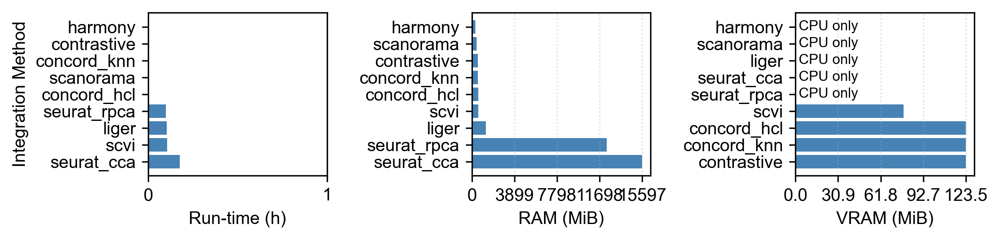

In [4]:
from benchmark_utils import collect_benchmark_logs
methods = ["scvi", "harmony", "scanorama", "liger", "unintegrated", "concord_hcl", "concord_knn", "contrastive", "seurat_cca", "seurat_rpca"]

bench_df = collect_benchmark_logs(file_name, methods)
# Save the benchmark results
bench_df.to_csv(save_dir / f"benchmark_summary_{file_suffix}.tsv", sep="\t", index=False)
print(f"✅ Benchmark summary saved to: {save_dir / f'benchmark_summary_{file_suffix}.tsv'}")
# Plot benchmark results
from benchmark_utils import plot_benchmark_performance
import matplotlib.pyplot as plt
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}
with plt.rc_context(rc=custom_rc):
    plot_benchmark_performance(bench_df, figsize=(8,2), dpi=300, save_path = save_dir / f"benchmark_plot_{file_suffix}.pdf")


In [6]:
adata = sc.read(
    data_dir / "dataset.h5ad"
)
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [7]:
from benchmark_utils import add_embeddings
adata = add_embeddings(adata, proj_name=proj_name, methods=methods)

✅ obsm['scvi'] loaded
✅ obsm['harmony'] loaded
✅ obsm['scanorama'] loaded
✅ obsm['liger'] loaded
✅ obsm['unintegrated'] loaded
✅ obsm['concord_hcl'] loaded
✅ obsm['concord_knn'] loaded
✅ obsm['contrastive'] loaded
✅ obsm['seurat_cca'] loaded
✅ obsm['seurat_rpca'] loaded


In [8]:
# Run umap for all latent embeddings
for basis in methods:
    print("Running UMAP for", basis)
    if basis not in adata.obsm:
        print(f"{basis} not found.")
        continue
    #if 'UMAP' not in basis:
    ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
    ccd.ul.run_umap(adata, source_key=basis, result_key=f'{basis}_UMAP_3D', n_components=3, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)

# Save obsm 
ccd.ul.save_obsm_to_hdf5(adata, save_dir / f"{file_name}_obsm_final.h5")
adata.write_h5ad(data_dir / f"{file_name}_adata_final.h5ad")
print(f"✅ Saved adata with embeddings to {data_dir / f'{file_name}_adata_final.h5ad'}")

Running UMAP for scvi


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP']
concord - INFO - UMAP embedding stored in adata.obsm['scvi_UMAP_3D']
Running UMAP for harmony
concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP']
concord - INFO - UMAP embedding stored in adata.obsm['harmony_UMAP_3D']
Running UMAP for scanorama
concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP']
concord - INFO - UMAP embedding stored in adata.obsm['scanorama_UMAP_3D']
Running UMAP for liger
concord - INFO - UMAP embedding stored in adata.obsm['liger_UMAP']
concord - INFO - UMAP embedding stored in adata.obsm['liger_UMAP_3D']
Running UMAP for unintegrated
concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP']
concord - INFO - UMAP embedding stored in adata.obsm['unintegrated_UMAP_3D']
Running UMAP for concord_hcl
concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_UMAP']
concord - INFO - UMAP embedding stored in adata.obsm['concord_hcl_UMAP_3D']
Running 

In [10]:
adata.obs

,tech,celltype,size_factors,n_counts,cell_type,batch
D101_5,celseq,gamma,4057.480225,4057.480225,gamma,celseq
D101_43,celseq,gamma,10604.392578,10604.392578,gamma,celseq
D101_93,celseq,gamma,4921.611328,4921.611328,gamma,celseq
D102_4,celseq,gamma,6157.592773,6157.592773,gamma,celseq
D172444_23,celseq,gamma,4803.835938,4803.835938,gamma,celseq
...,...,...,...,...,...,...
Sample_1594,smarter,gamma,495900.125000,495900.125000,gamma,smarter
Sample_1595,smarter,gamma,326958.093750,326958.093750,gamma,smarter
Sample_1597,smarter,gamma,420117.375000,420117.375000,gamma,smarter
Sample_1598,smarter,gamma,410836.875000,410836.875000,gamma,smarter


concord.plotting.pl_embedding - INFO - Plotting scvi with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting unintegrated with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting seurat_cca with tech in UMAP
concord.plotting.pl_embedding - INFO - Plotting seurat_rpca with tech in UMAP


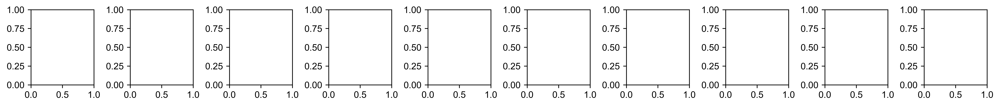

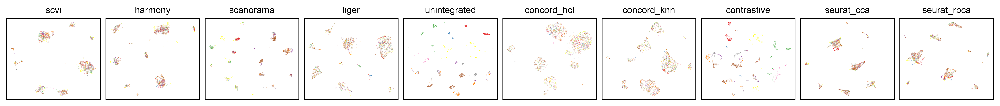

concord.plotting.pl_embedding - INFO - Plotting scvi with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting unintegrated with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting seurat_cca with celltype in UMAP
concord.plotting.pl_embedding - INFO - Plotting seurat_rpca with celltype in UMAP


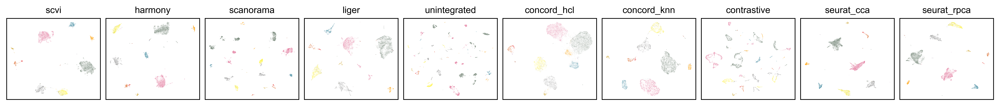

concord.plotting.pl_embedding - INFO - Plotting scvi with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting harmony with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting scanorama with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting liger with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting unintegrated with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_hcl with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting concord_knn with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting contrastive with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting seurat_cca with batch in UMAP
concord.plotting.pl_embedding - INFO - Plotting seurat_rpca with batch in UMAP


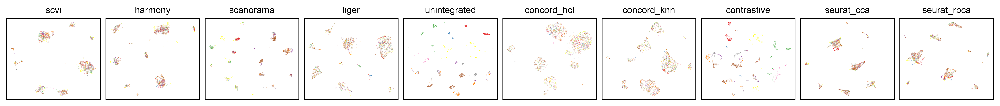

In [11]:
# plot everything
import matplotlib.pyplot as plt
import numpy as np
from matplotlib import rcParams

# Set Arial as the default font
custom_rc = {
    'font.family': 'Arial',  # Set the desired font for this plot
}

show_keys = methods
show_cols = ['tech', 'celltype', 'batch']
basis_types = ['UMAP']

font_size=10
point_size=.1
alpha=0.8
ncols = len(show_keys)
figsize=(ncols * 1.5,1.5)
nrows = int(np.ceil(len(show_keys) / ncols))

with plt.rc_context(rc=custom_rc):
    ccd.pl.plot_all_embeddings(
        adata,
        show_keys,
        color_bys=show_cols,
        basis_types=basis_types,
        #pal=pal,
        font_size=font_size,
        point_size=point_size,
        alpha=alpha,
        figsize=figsize,
        ncols=ncols,
        seed=seed,
        save_dir=save_dir,
        file_suffix=file_suffix,
        dpi=600,
        save_format='svg'
    )


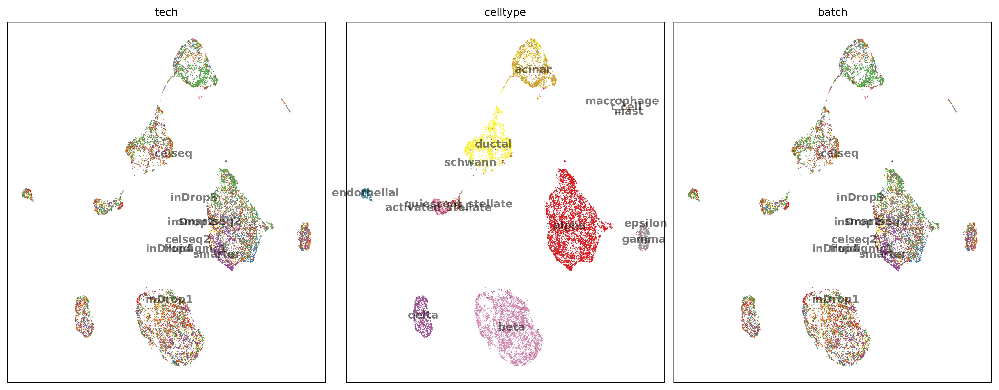

In [17]:
basis = 'concord_knn'
show_basis = basis + '_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(13,5), dpi=600, ncols=3, font_size=10, point_size=3, legend_loc="on data",
    save_path=save_dir / f"{show_basis}_{file_suffix}.pdf"
)

### Separately run CONCORD

In [4]:
adata = sc.read(
    data_dir / "dataset.h5ad"
)
adata.X = adata.layers["counts"].copy()
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [ ]:
feature_list = ccd.ul.select_features(adata, n_top_features=3000, flavor='seurat_v3')
concord_args = {
        'adata': adata,
        'input_feature': feature_list,
        'latent_dim': 30,
        'batch_size': 64,
        'augmentation_mask_prob': 0.5, 
        'clr_temperature': 0.3,
        'p_intra_knn': 0.0,
        'clr_beta': 0.3,
        'sampler_knn': 300,
        'sampler_emb': 'X_pca',
        'p_intra_domain': 1.0,
        'n_epochs': 15,
        'domain_key': 'batch',
        'verbose': False,
        'seed': seed,
        'device': device,
        'save_dir': save_dir
    }

output_key = f'Concord_knn'
cur_ccd = ccd.Concord(use_decoder=False, **concord_args)
cur_ccd.fit_transform(output_key=output_key)

concord.utils.feature_selector - INFO - Selecting highly variable features with flavor seurat_v3...
concord - WARNING - FAISS not found. Using sklearn for k-NN computation.
Epoch 0 Training
Epoch 1 Training
Epoch 2 Training
Epoch 3 Training
Epoch 4 Training
Epoch 5 Training
Epoch 6 Training
Epoch 7 Training
Epoch 8 Training
Epoch 9 Training
Epoch 10 Training
Epoch 11 Training
Epoch 12 Training
Epoch 13 Training
Epoch 14 Training


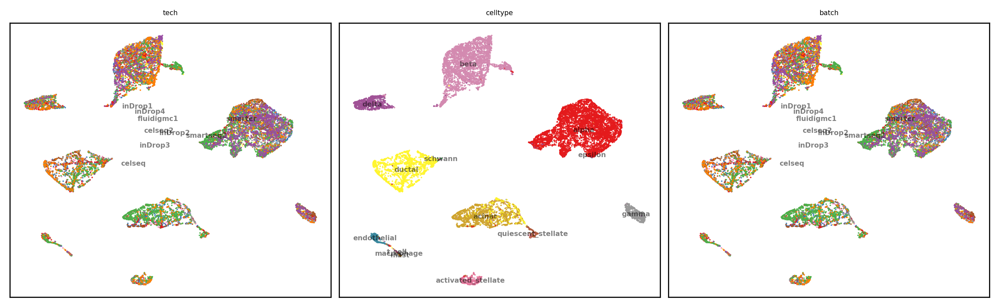

In [ ]:
ccd.ul.run_umap(adata, source_key=output_key, result_key=f'{output_key}_UMAP', n_components=2, n_neighbors=30, min_dist=0.1, metric='euclidean', random_state=seed)
#output_key = 'Concord'
show_cols = ['tech', 'celltype', 'batch']
show_basis = f'{output_key}_UMAP'
ccd.pl.plot_embedding(
    adata, show_basis, show_cols, figsize=(10,3), dpi=300, ncols=3, font_size=5, point_size=3, legend_loc='on data',
    save_path=save_dir / f"embeddings_{show_basis}_{file_suffix}.png"
)